# METABRIC Breast Cancer Dataset Analysis with PCA

This notebook performs a comprehensive analysis of the METABRIC breast cancer dataset, focusing on:
- Exploratory data analysis of clinical variables
- Principal Component Analysis (PCA) of gene expression (RNA) data
- PCA of mutation data
- Visualization of PCA results with an interactive graph

- LDA Analysis of Chosen Variables
- Visualization of LDA results with an interactive graph

### Import Necessary Libraries

In [2]:
# Import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA
from sklearn.manifold import TSNE
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import warnings
warnings.filterwarnings('ignore')

# Set plotting style
plt.style.use('seaborn-v0_8-whitegrid')
sns.set_palette('viridis')

### Loading and Exploring the Dataset

Load the METABRIC dataset and perform an initial exploration to understand its structure.
I'll check:
- Dataset dimensions
- Types of features
- Missing values

In [3]:
# Load the dataset
def load_data():
    """Load the METABRIC dataset and perform initial exploration."""
    print("Loading METABRIC dataset...")
    df = pd.read_csv('METABRIC_RNA_Mutation.csv')
    
    print(f"Dataset dimensions: {df.shape}")
    
    # Display basic information
    print("\nBasic information about the dataset:")
    print(f"Number of patients: {df.shape[0]}")
    print(f"Number of features: {df.shape[1]}")
    
    # Check for missing values
    # missing_values = df.isnull().sum()
    # print(f"\nFeatures with most missing values:")
    # print(missing_values[missing_values > 0].sort_values(ascending=False).head(10))
    
    return df

# Load the data
df = load_data()

# Display the first few rows to see the structure
df.head()

Loading METABRIC dataset...
Dataset dimensions: (1904, 693)

Basic information about the dataset:
Number of patients: 1904
Number of features: 693


,patient_id,age_at_diagnosis,type_of_breast_surgery,cancer_type,cancer_type_detailed,cellularity,chemotherapy,pam50_+_claudin-low_subtype,cohort,er_status_measured_by_ihc,...,mtap_mut,ppp2cb_mut,smarcd1_mut,nras_mut,ndfip1_mut,hras_mut,prps2_mut,smarcb1_mut,stmn2_mut,siah1_mut
0,0,75.65,MASTECTOMY,Breast Cancer,Breast Invasive Ductal Carcinoma,NaN,0,claudin-low,1.0,Positve,...,0,0,0,0,0,0,0,0,0,0
1,2,43.19,BREAST CONSERVING,Breast Cancer,Breast Invasive Ductal Carcinoma,High,0,LumA,1.0,Positve,...,0,0,0,0,0,0,0,0,0,0
2,5,48.87,MASTECTOMY,Breast Cancer,Breast Invasive Ductal Carcinoma,High,1,LumB,1.0,Positve,...,0,0,0,0,0,0,0,0,0,0
3,6,47.68,MASTECTOMY,Breast Cancer,Breast Mixed Ductal and Lobular Carcinoma,Moderate,1,LumB,1.0,Positve,...,0,0,0,0,0,0,0,0,0,0
4,8,76.97,MASTECTOMY,Breast Cancer,Breast Mixed Ductal and Lobular Carcinoma,High,1,LumB,1.0,Positve,...,0,0,0,0,0,0,0,0,0,0


# Dataset Summary

Let's examine the clinical variables in the dataset. We'll create:
1. Summary tables of categorical variables
2. Visualizations of key clinical attributes
3. Correlation analysis of numerical variables

### Clinical Variables

- Summary tables of categorical variables

In [4]:
def summarize_clinical_data(df):
    """Create summary tables and visualizations for clinical variables."""
    # Create a summary dataframe for categorical variables
    cat_vars = ['cancer_type_detailed', 'er_status', 'her2_status', 'type_of_breast_surgery', 
                'chemotherapy', 'overall_survival', 'tumor_other_histologic_subtype', 'neoplasm_histologic_grade']
    
    summary_tables = {}
    
    for var in cat_vars:
        counts = df[var].value_counts()
        percentages = df[var].value_counts(normalize=True) * 100
        summary = pd.DataFrame({
            'Count': counts,
            'Percentage (%)': percentages.round(2)
        })
        summary_tables[var] = summary
        # print(f"\nDistribution of {var}:")
        # print(summary)
    
    return summary_tables

# Generate summary tables
summary_tables = summarize_clinical_data(df)

summary_tables['cancer_type_detailed']

,Count,Percentage (%)
cancer_type_detailed,,
Breast Invasive Ductal Carcinoma,1500,79.41
Breast Mixed Ductal and Lobular Carcinoma,207,10.96
Breast Invasive Lobular Carcinoma,142,7.52
Breast Invasive Mixed Mucinous Carcinoma,22,1.16
Breast,17,0.90
Metaplastic Breast Cancer,1,0.05


### Visualizing Age Distribution and Survival

Now let's create visualizations to better understand the age distribution and survival patterns.

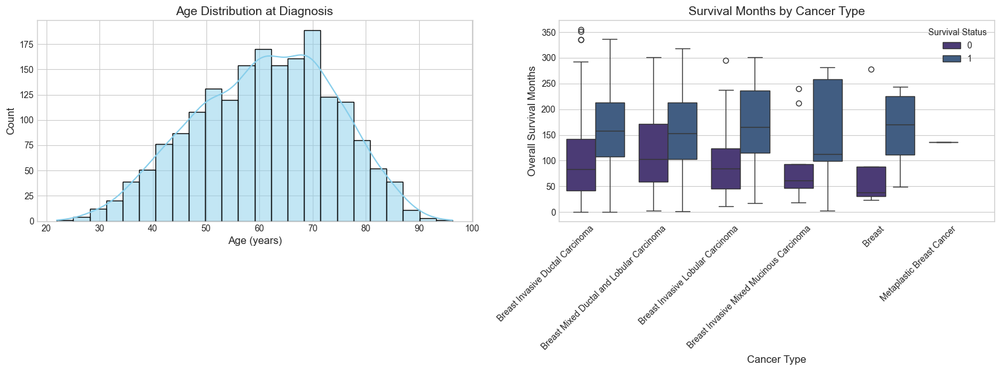

In [5]:
# Figure 1: Age distribution and survival
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Age distribution
sns.histplot(df['age_at_diagnosis'].dropna(), kde=True, ax=axes[0], color='skyblue')
axes[0].set_title('Age Distribution at Diagnosis', fontsize=14)
axes[0].set_xlabel('Age (years)', fontsize=12)
axes[0].set_ylabel('Count', fontsize=12)

# Survival months by cancer type
sns.boxplot(x='cancer_type_detailed', y='overall_survival_months', 
            hue='overall_survival', data=df, ax=axes[1])
plt.setp(axes[1].get_xticklabels(), rotation=45, ha='right')
axes[1].set_title('Survival Months by Cancer Type', fontsize=14)
axes[1].set_xlabel('Cancer Type', fontsize=12)
axes[1].set_ylabel('Overall Survival Months', fontsize=12)
axes[1].legend(title='Survival Status')

plt.tight_layout()
plt.show()

### Cancer Type and Treatment Distribution

Now let's look at the distribution of cancer types and treatment approaches.

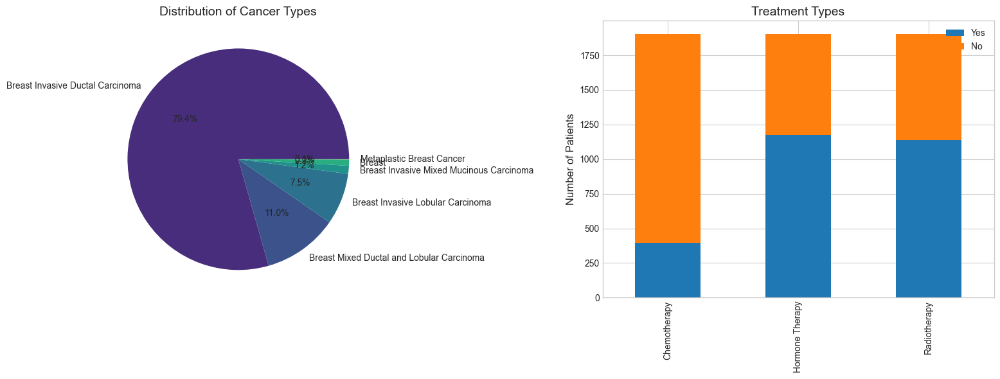

In [6]:
# Figure 2: Cancer type distribution and treatment type distribution
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Cancer type distribution
df['cancer_type_detailed'].value_counts().plot.pie(
    autopct='%1.1f%%', ax=axes[0], colors=sns.color_palette('viridis', len(df['cancer_type_detailed'].unique()))
)
axes[0].set_title('Distribution of Cancer Types', fontsize=14)
axes[0].set_ylabel('')

# Treatment types
treatment_data = pd.DataFrame({
    'Yes': [df['chemotherapy'].sum(), df['hormone_therapy'].sum(), df['radio_therapy'].sum()],
    'No': [(df['chemotherapy'] == 0).sum(), (df['hormone_therapy'] == 0).sum(), 
           (df['radio_therapy'] == 0).sum()]
}, index=['Chemotherapy', 'Hormone Therapy', 'Radiotherapy'])

treatment_data.plot(kind='bar', stacked=True, ax=axes[1], color=['#1f77b4', '#ff7f0e'])
axes[1].set_title('Treatment Types', fontsize=14)
axes[1].set_xlabel('')
axes[1].set_ylabel('Number of Patients', fontsize=12)

plt.tight_layout()
plt.show()

### Distribution of Mutation Counts

Finally, let's visualize the distribution of mutation counts across patients.

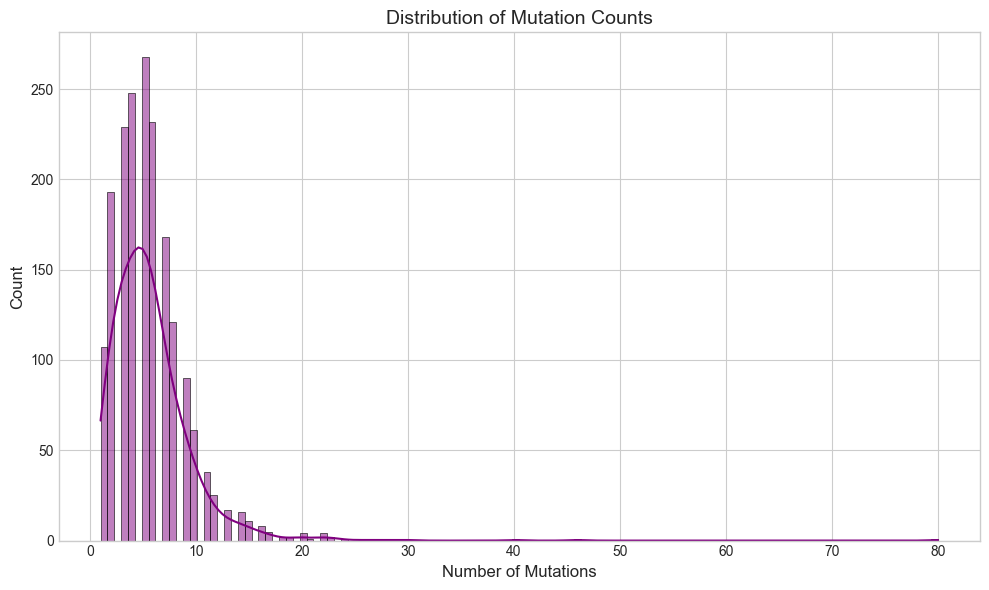

In [7]:
# Figure 4: Distribution of mutation counts
plt.figure(figsize=(10, 6))
sns.histplot(df['mutation_count'].dropna(), kde=True, color='purple')
plt.title('Distribution of Mutation Counts', fontsize=14)
plt.xlabel('Number of Mutations', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.tight_layout()
plt.show()

# PCA on RNA Expression Data

Now we'll perform Principal Component Analysis (PCA) on the RNA expression z-scores. This will help us:
1. Reduce dimensionality of the complex gene expression data
2. Identify patterns that might separate different cancer subtypes
3. Determine which genes contribute most to variation in the data

### Extract RNA Data
- First, let's extract the RNA data and prepare it for PCA.

In [8]:
def extract_rna_data(df):
    """Extract RNA z-score data from the dataset."""
    # Identify RNA z-score columns (numeric columns that don't end with _mut and aren't clinical)
    clinical_cols = ['patient_id', 'age_at_diagnosis', 'type_of_breast_surgery', 
                     'cancer_type', 'cancer_type_detailed', 'cellularity', 'chemotherapy',
                     'pam50_+_claudin-low_subtype', 'cohort', 'er_status_measured_by_ihc',
                     'er_status', 'neoplasm_histologic_grade', 'her2_status_measured_by_snp6',
                     'her2_status', 'tumor_other_histologic_subtype', 'hormone_therapy',
                     'inferred_menopausal_state', 'integrative_cluster', 'primary_tumor_laterality',
                     'lymph_nodes_examined_positive', 'mutation_count', 'nottingham_prognostic_index',
                     'oncotree_code', 'overall_survival_months', 'overall_survival', 'pr_status',
                     'radio_therapy', '3-gene_classifier_subtype', 'tumor_size', 'tumor_stage', 'death_from_cancer']
    
    mutation_cols = [col for col in df.columns if col.endswith('_mut')]
    
    # RNA z-score columns (numeric, not in clinical_cols or mutation_cols)
    rna_cols = [col for col in df.columns if col not in clinical_cols and col not in mutation_cols
                and df[col].dtype != 'object']
    
    print(f"Number of RNA z-score features: {len(rna_cols)}")
    
    # Prepare RNA data for PCA
    rna_data = df[rna_cols].copy()
    
    # Handle missing values (replace with mean)
    rna_data = rna_data.fillna(rna_data.mean())
    
    return rna_data, rna_cols

# Extract RNA data
rna_data, rna_cols = extract_rna_data(df)

Number of RNA z-score features: 489


### Performing PCA on RNA Expression Data

Now let's perform PCA on the RNA expression data with 20 components and examine the results.

In [9]:
def run_rna_pca(rna_data, df):
    """Perform PCA on RNA z-score data."""
    print("\nPerforming PCA on RNA z-scores...")
    
    # Standardize the data
    scaler = StandardScaler()
    rna_scaled = scaler.fit_transform(rna_data)
    
    # Run PCA
    pca = PCA(n_components=40)  # Start with 40 components
    pca_result = pca.fit_transform(rna_scaled)
    
    # Create a DataFrame with PCA results
    pca_df = pd.DataFrame(
        data=pca_result,
        columns=[f'PC{i+1}' for i in range(40)]
    )

    color_vars = ['cancer_type_detailed', 'type_of_breast_surgery', 'er_status', 'her2_status', 'tumor_other_histologic_subtype', 'integrative_cluster', 'overall_survival', 'pr_status', 'neoplasm_histologic_grade']

    # Add clinical variables for visualization
    pca_df['patient_id'] = df['patient_id'].values
    for col in color_vars:
        if col in df.columns:
            pca_df[col] = df[col].values
    
    # Print variance explained
    explained_variance = pca.explained_variance_ratio_
    cumulative_variance = np.cumsum(explained_variance)
    
    print("\nPCA on RNA z-scores - Explained variance by component:")
    for i, (var, cum_var) in enumerate(zip(explained_variance, cumulative_variance)):
        if i < 4 or i > 35:
            print(f"PC{i+1}: {var:.4f} ({cum_var:.4f} cumulative)")
        if i == 4:
            print("...")

    
    return pca_df, pca, rna_scaled

# Run PCA on RNA data
rna_pca_df, rna_pca, rna_scaled = run_rna_pca(rna_data, df)


Performing PCA on RNA z-scores...

PCA on RNA z-scores - Explained variance by component:
PC1: 0.0800 (0.0800 cumulative)
PC2: 0.0669 (0.1469 cumulative)
PC3: 0.0554 (0.2022 cumulative)
PC4: 0.0381 (0.2403 cumulative)
...
PC37: 0.0040 (0.5206 cumulative)
PC38: 0.0039 (0.5245 cumulative)
PC39: 0.0038 (0.5283 cumulative)
PC40: 0.0037 (0.5320 cumulative)


### Visualizing Explained Variance

- Let's visualize how much variance each principal component explains in the RNA data.
- Using an arbitrary 80% explained variance threshold

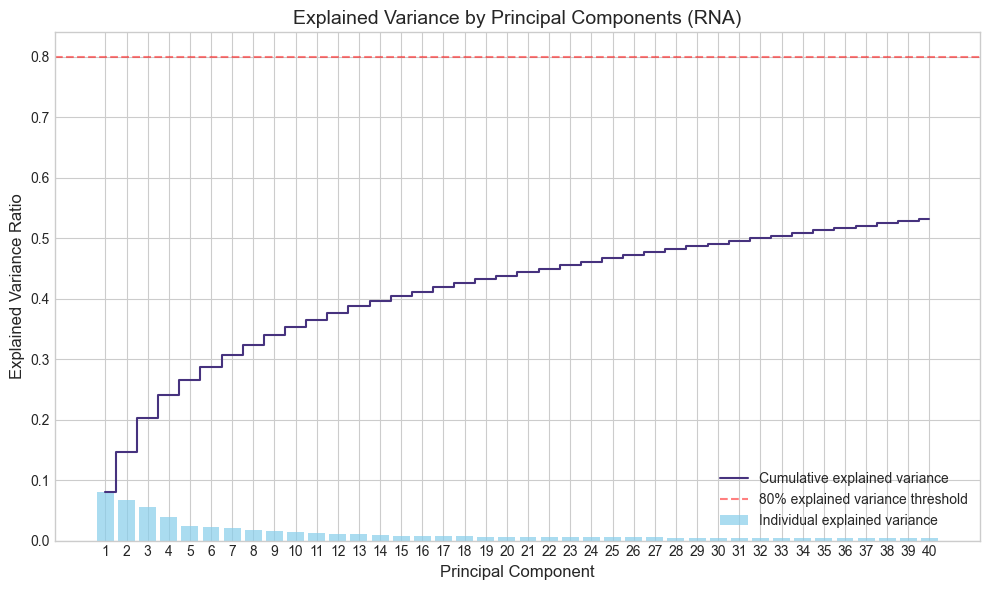

In [10]:
# Create a variance plot for RNA PCA
explained_variance = rna_pca.explained_variance_ratio_
cumulative_variance = np.cumsum(explained_variance)

plt.figure(figsize=(10, 6))
plt.bar(range(1, len(explained_variance) + 1), explained_variance, alpha=0.7, color='skyblue',
        label='Individual explained variance')
plt.step(range(1, len(cumulative_variance) + 1), cumulative_variance, where='mid', 
         label='Cumulative explained variance')
plt.axhline(y=0.8, color='r', linestyle='--', alpha=0.5, label='80% explained variance threshold')
plt.xlabel('Principal Component', fontsize=12)
plt.ylabel('Explained Variance Ratio', fontsize=12)
plt.title('Explained Variance by Principal Components (RNA)', fontsize=14)
plt.xticks(range(1, len(explained_variance) + 1))
plt.legend()
plt.tight_layout()
plt.show()

### Define Function to create PCA Plot
- This function takes in the PCA results and creates an interactive plot
- Same function will also be used for Mutation Data

In [11]:
def create_improved_pca_plot(pca_df, pca, data_type='RNA'):
    """Create an improved interactive PCA plot with properly updating colors."""
    
    # Define the possible color variables
    color_vars = ['cancer_type_detailed', 'type_of_breast_surgery', 'er_status', 'her2_status', 'tumor_other_histologic_subtype', 'integrative_cluster', 'oncotree_code', 'overall_survival', 'pr_status', 'neoplasm_histologic_grade']
    
    # Create a base figure
    fig = go.Figure()
    
    # Add traces for the initial color variable (cancer_type_detailed)
    categories = pca_df['cancer_type_detailed'].unique()
    
    for category in categories:
        subset = pca_df[pca_df['cancer_type_detailed'] == category]
        fig.add_trace(
            go.Scatter(
                x=subset['PC1'],
                y=subset['PC2'],
                mode='markers',
                marker=dict(size=10),
                name=str(category),
                text=[f"Patient ID: {id}<br>PC1: {x:.4f}<br>PC2: {y:.4f}<br>Cancer Type: {cat}" 
                     for id, x, y, cat in zip(
                         subset['patient_id'], 
                         subset['PC1'], 
                         subset['PC2'], 
                         subset['cancer_type_detailed']
                     )],
                hoverinfo='text',
                legendgroup='cancer_type_detailed',
                visible=True
            )
        )
    
    # Add traces for each color variable, but set them to invisible initially
    for color_var in color_vars:
        if color_var == 'cancer_type_detailed':
            continue  # Skip cancer_type_detailed as it's already added
            
        if color_var in pca_df.columns:
            categories = pca_df[color_var].unique()
            
            for category in categories:
                subset = pca_df[pca_df[color_var] == category]
                fig.add_trace(
                    go.Scatter(
                        x=subset['PC1'],
                        y=subset['PC2'],
                        mode='markers',
                        marker=dict(size=10),
                        name=str(category),
                        text=[f"Patient ID: {id}<br>PC1: {x:.4f}<br>PC2: {y:.4f}<br>{color_var}: {cat}" 
                             for id, x, y, cat in zip(
                                 subset['patient_id'], 
                                 subset['PC1'], 
                                 subset['PC2'], 
                                 subset[color_var]
                             )],
                        hoverinfo='text',
                        legendgroup=color_var,
                        visible=False
                    )
                )
    
    # Create buttons for dropdown menu
    buttons = []
    
    # Count how many traces we have for each color variable
    trace_counts = {}
    current_trace = 0
    
    for color_var in color_vars:
        if color_var in pca_df.columns:
            n_categories = len(pca_df[color_var].unique())
            trace_counts[color_var] = n_categories
            
            # Create visibility list
            visible_list = [False] * len(fig.data)
            
            # Set appropriate traces to visible
            start_idx = 0
            for cv in color_vars:
                if cv == color_var:
                    for i in range(start_idx, start_idx + trace_counts.get(cv, 0)):
                        if i < len(visible_list):
                            visible_list[i] = True
                start_idx += trace_counts.get(cv, 0)
            
            buttons.append(
                dict(
                    label=color_var.replace('_', ' ').title(),
                    method='update',
                    args=[
                        {'visible': visible_list},
                        {'title': f'PCA of {data_type} Data (Colored by {color_var.replace("_", " ").title()})'}
                    ]
                )
            )
    
    # Update layout with dropdown menu
        fig.update_layout(
        title=f'PCA of {data_type} Data (Colored by Cancer Type)',
        xaxis=dict(
            title=dict(text=f'PC1 ({pca.explained_variance_ratio_[0]:.2%})', font=dict(size=14))
        ),
        yaxis=dict(
            title=dict(text=f'PC2 ({pca.explained_variance_ratio_[1]:.2%})', font=dict(size=14))
        ),
        updatemenus=[dict(
            type='dropdown',
            buttons=buttons,
            direction='down',
            showactive=True,
            x=0.05,
            xanchor='left',
            y=1.1,
            yanchor='top'
        )],
        annotations=[dict(
            text='Color by:',
            showarrow=False,
            x=-0.1,
            y=1.1,
            xref='paper',
            yref='paper',
            align='left'
        )],
        width=900,
        height=700,
        margin=dict(t=150)  # Add margin at top to prevent title overlap
    )

    return fig

# Plot Interactive PCA for RNA Data

#### About the Plot
This PCA Plot only uses the first two principle components which represent the most variation in RNA data. The color code is determined by the value in the drop down menu. You can change how the points are colored by editing this value. 

In [12]:

# Create improved PCA plots
rna_improved_fig = create_improved_pca_plot(rna_pca_df, rna_pca, 'RNA')

# Display the improved RNA PCA plot
rna_improved_fig.show()

In [13]:
rna_improved_fig.write_html("HTML_Assets/pca_RNA.html")

# PCA on Mutation Data

Now I'll perform similar PCA analysis on the mutation data. First, I'll extract and prepare the mutation data.

In [14]:
def extract_mutation_data(df):
    """Extract mutation data from the dataset and convert to binary format."""
    # Identify mutation columns
    mutation_cols = [col for col in df.columns if col.endswith('_mut')]
    print(f"Number of mutation features: {len(mutation_cols)}")
    
    # Examine the actual values in these columns
    print("\nSample of mutation data values:")
    for col in mutation_cols[:5]:  # Look at first 5 mutation columns
        print(f"\n{col} unique values:")
        print(df[col].value_counts().head())
    
    # Prepare mutation data for PCA
    mutation_data = df[mutation_cols].copy()
    
    # Convert to binary (1 for any mutation present, 0 for no mutation)
    for col in mutation_cols:
        # Check if values are already numeric
        if pd.api.types.is_numeric_dtype(mutation_data[col]):
            # If already numeric, keep as is (0 = no mutation, anything else = mutation)
            mutation_data[col] = mutation_data[col].apply(lambda x: 1 if x > 0 else 0)
        else:
            # For string columns, NaN or empty strings = no mutation, anything else = mutation
            mutation_data[col] = mutation_data[col].apply(
                lambda x: 0 if pd.isna(x) or x == '' or str(x).strip() in ['0', 'false', 'no', 'none', 'null'] else 1
            )

    # Verify conversion to binary
    print("\nAfter conversion to binary, sample counts:")
    for col in mutation_cols[:5]:
        print(f"{col}: {mutation_data[col].value_counts().to_dict()}")
    
    # Fill remaining missing values with 0 (assume no mutation if missing)
    mutation_data = mutation_data.fillna(0)
    
    return mutation_data, mutation_cols

# Extract mutation data
mutation_data, mutation_cols = extract_mutation_data(df)

Number of mutation features: 173

Sample of mutation data values:

pik3ca_mut unique values:
pik3ca_mut
0         1109
H1047R     285
E545K      127
E542K       72
N345K       42
Name: count, dtype: int64

tp53_mut unique values:
tp53_mut
0        1245
R175H      34
R248Q      20
R248W      17
R213*      15
Name: count, dtype: int64

muc16_mut unique values:
muc16_mut
0         1578
L7102F       5
T7149A       4
D902A        3
V8260M       3
Name: count, dtype: int64

ahnak2_mut unique values:
ahnak2_mut
0         1593
V2061L      34
G812A        5
H1235P       3
G400S        3
Name: count, dtype: int64

kmt2c_mut unique values:
kmt2c_mut
0         1670
P3555T       3
H1424=       3
Q2128P       3
M1819T       2
Name: count, dtype: int64

After conversion to binary, sample counts:
pik3ca_mut: {0: 1109, 1: 795}
tp53_mut: {0: 1245, 1: 659}
muc16_mut: {0: 1578, 1: 326}
ahnak2_mut: {0: 1593, 1: 311}
kmt2c_mut: {0: 1670, 1: 234}


### Performing PCA on Mutation Data

Run PCA on the mutation data.

In [15]:
def run_mutation_pca(mutation_data, df):
    """Perform PCA on mutation data."""
    print("\nPerforming PCA on mutation data...")
    
    # Run PCA on mutation data
    pca = PCA(n_components=40)
    pca_result = pca.fit_transform(mutation_data)
    
    # Create a DataFrame with PCA results
    pca_df = pd.DataFrame(
        data=pca_result,
        columns=[f'PC{i+1}' for i in range(40)]
    )
    
    color_vars = ['cancer_type_detailed', 'type_of_breast_surgery', 'er_status', 'her2_status', 'tumor_other_histologic_subtype', 'integrative_cluster', 'overall_survival', 'pr_status', 'neoplasm_histologic_grade']

    # Add clinical variables for visualization
    pca_df['patient_id'] = df['patient_id'].values
    for col in color_vars:
        if col in df.columns:
            pca_df[col] = df[col].values
    
    # Print variance explained
    explained_variance = pca.explained_variance_ratio_
    cumulative_variance = np.cumsum(explained_variance)
    
    print("\nPCA on mutation data - Explained variance by component:")
    for i, (var, cum_var) in enumerate(zip(explained_variance, cumulative_variance)):
        if i < 4 or i > 35:
            print(f"PC{i+1}: {var:.4f} ({cum_var:.4f} cumulative)")
        if i == 4:
            print("...")
    
    return pca_df, pca

# Run PCA on mutation data
mutation_pca_df, mutation_pca = run_mutation_pca(mutation_data, df)


Performing PCA on mutation data...

PCA on mutation data - Explained variance by component:
PC1: 0.0644 (0.0644 cumulative)
PC2: 0.0469 (0.1113 cumulative)
PC3: 0.0370 (0.1483 cumulative)
PC4: 0.0280 (0.1763 cumulative)
...
PC37: 0.0080 (0.6201 cumulative)
PC38: 0.0078 (0.6279 cumulative)
PC39: 0.0075 (0.6354 cumulative)
PC40: 0.0073 (0.6427 cumulative)


### Visualizing Explained Variance for Mutation PCA

Visualize the explained variance for the mutation PCA.

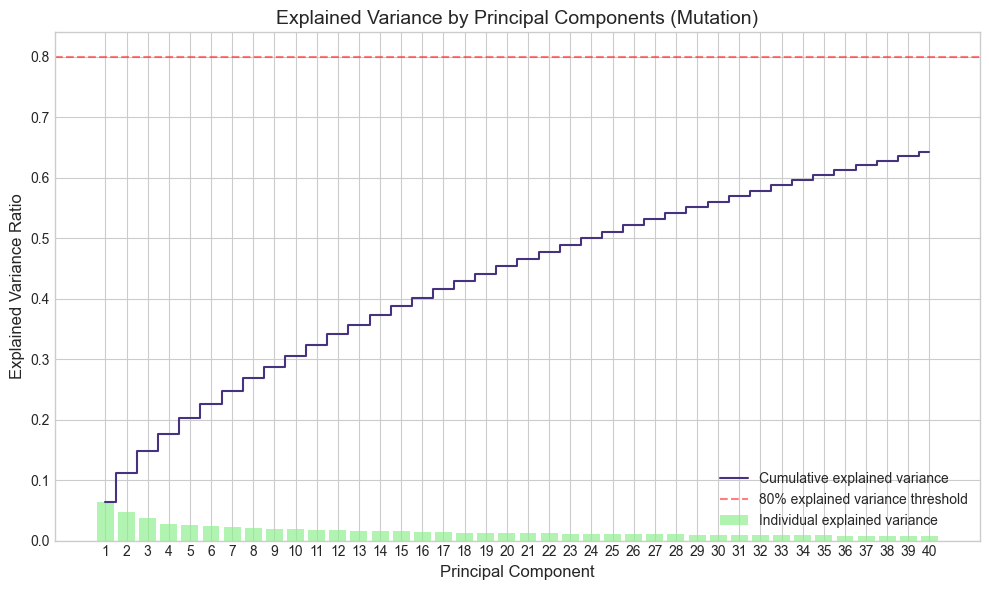

In [16]:
# Create a variance plot for mutation PCA
explained_variance = mutation_pca.explained_variance_ratio_
cumulative_variance = np.cumsum(explained_variance)

plt.figure(figsize=(10, 6))
plt.bar(range(1, len(explained_variance) + 1), explained_variance, alpha=0.7, color='lightgreen',
        label='Individual explained variance')
plt.step(range(1, len(cumulative_variance) + 1), cumulative_variance, where='mid', 
         label='Cumulative explained variance')
plt.axhline(y=0.8, color='r', linestyle='--', alpha=0.5, label='80% explained variance threshold')
plt.xlabel('Principal Component', fontsize=12)
plt.ylabel('Explained Variance Ratio', fontsize=12)
plt.title('Explained Variance by Principal Components (Mutation)', fontsize=14)
plt.xticks(range(1, len(explained_variance) + 1))
plt.legend()
plt.tight_layout()
plt.show()

# Interactive PCA Visualization of Mutation Data

Visualize the first two principal components of the mutation data in an interactive scatter plot.

#### About the Plot
This PCA Plot only uses the first two principle components which represent the most variation in mutation data. The color code is determined by the value in the drop down menu. You can change how the points are colored by editing this value. 

In [17]:
# Create improved PCA plots
mutation_improved_fig = create_improved_pca_plot(mutation_pca_df, mutation_pca, 'Mutation')

# Display the improved mutation PCA plot
mutation_improved_fig.show()

# LDA on on Mutation and RNA Data

**About Linear Discriminant Analysis (LDA):**

- Also reduces the number of features but focuses on class separation.

- Finds directions that best separate different groups or classes.

- Uses the known labels of the data (supervised).

- Often used to improve classification tasks.

### Load Dataset Labels and Descriptions
Pandas DataFrame of variable names with their associated data types and descriptions

In [18]:
# Store the label table as a DataFrame
# ----------------------------
data = {
    "Name": [
        "patient_id", "age_at_diagnosis", "type_of_breast_surgery", "cancer_type",
        "cancer_type_detailed", "cellularity", "chemotherapy",
        "pam50_+_claudin-low_subtype", "cohort", "er_status_measured_by_ihc",
        "er_status", "neoplasm_histologic_grade", "her2_status_measured_by_snp6",
        "her2_status", "tumor_other_histologic_subtype", "hormone_therapy",
        "inferred_menopausal_state", "integrative_cluster", "primary_tumor_laterality",
        "lymph_nodes_examined_positive", "mutation_count", "nottingham_prognostic_index",
        "oncotree_code", "overall_survival_months", "overall_survival", "pr_status",
        "radio_therapy", "3-gene_classifier_subtype", "tumor_size", "tumor_stage",
        "death_from_cancer"
    ],
    "Type": [
        "object", "float", "object", "object", "object", "object", "int",
        "object", "float", "float", "object", "int", "object", "object", "object",
        "int", "object", "object", "object", "float", "float", "float", "object",
        "float", "object", "object", "int", "object", "float", "float", "int"
    ],
    "Description": [
        "Patient ID",
        "Age of the patient at diagnosis time",
        "Breast cancer surgery type",
        "Breast cancer types: 1- Breast Cancer or 2- Breast Sarcoma",
        "Detailed Breast cancer types",
        "Cancer cellularity post chemotherapy, indicating the amount and arrangement of tumor cells",
        "Whether or not the patient had chemotherapy as a treatment",
        "Pam 50 test result with claudin-low subtype info; indicates likelihood of metastasis and expression patterns",
        "Cohort group (value from 1 to 5)",
        "Estrogen receptor expression assessed by IHC (positive/negative)",
        "Cancer cells are positive or negative for estrogen receptors",
        "Tumor grade determined by pathology (value from 1 to 3)",
        "HER2 status assessed by SNP6 or similar techniques",
        "Whether the cancer is positive or negative for HER2",
        "Cancer tissue subtype based on microscopic examination",
        "Whether the patient had hormonal therapy",
        "Inferred menopausal state (post/pre)",
        "Molecular subtype of the cancer from gene expression",
        "Laterality of the primary tumor (right or left breast)",
        "Number of lymph nodes with cancer involvement",
        "Number of genes with relevant mutations",
        "Nottingham prognostic index calculated from tumor size, lymph nodes, and grade",
        "Unique OncoTree code for the cancer diagnosis",
        "Duration from intervention to death (months)",
        "Overall survival status (alive/dead)",
        "Progesterone receptor status (positive/negative)",
        "Whether the patient had radiotherapy",
        "Three-gene classifier subtype",
        "Tumor size measured by imaging techniques",
        "Tumor stage based on spread and involvement of structures",
        "Whether the patient's death was due to cancer"
    ]
}
label_table = pd.DataFrame(data)

# ----------------------------
# Helper function to get description for a variable
# ----------------------------
def get_label_description(var_name):
    row = label_table[label_table["Name"] == var_name]
    if not row.empty:
        return row["Description"].iloc[0]
    return "No description available."


### Define LDA functions
This function will apply LDA and try to separate the data based on the target_vars passed to it

In [19]:
def apply_lda_with_selection(rna_scaled, mutation_data, df, target_vars, label_vars):
    """Apply LDA with selectable target and color variables."""
      
    # Filter to only include variables that exist and have multiple classes
    valid_target_vars = []
    for var in target_vars:
        if var in df.columns and len(df[var].dropna().unique()) > 1:
            valid_target_vars.append(var)
            # Check that we have enough samples for each class
            # class_counts = df[var].value_counts()
            # if all(count >= 5 for count in class_counts):
            #     valid_target_vars.append(var)
    
    print(f"Variables available for LDA: {valid_target_vars}")
    
    # Create LDA results for each target variable
    lda_results = {}
    
    for target_var in valid_target_vars:
        # Get the target labels
        y = df[target_var].fillna('Unknown').astype(str)
        
        # Filter out rows with unknown values
        valid_indices = y != 'Unknown'
        X_valid_rna = rna_scaled[valid_indices]
        X_valid_mutation = mutation_data.loc[valid_indices].values
        y_valid = y[valid_indices]
        
        # Skip if too few samples or only one class
        if len(y_valid) < 10 or len(y_valid.unique()) < 2:
            continue
        
        try:
            # Apply LDA to RNA data
            n_components = min(2, len(y_valid.unique())-1)  # Can't have more components than classes-1
            lda_rna = LDA(n_components=n_components)
            lda_rna_result = lda_rna.fit_transform(X_valid_rna, y_valid)
            
            # Create a DataFrame with LDA results
            lda_rna_df = pd.DataFrame(
                data=lda_rna_result,
                columns=[f'LD{i+1}' for i in range(n_components)]
            )
            
            # Add target variable and other variables for coloring
            lda_rna_df[target_var] = y_valid.values
            for col in label_vars:
                if col != target_var and col in df.columns:
                    lda_rna_df[col] = df.loc[valid_indices, col].values
            
            # Store in results
            lda_results[f'RNA_{target_var}'] = lda_rna_df
            
            # Apply LDA to mutation data
            lda_mutation = LDA(n_components=n_components)
            lda_mutation_result = lda_mutation.fit_transform(X_valid_mutation, y_valid)
            
            # Create a DataFrame with LDA results
            lda_mutation_df = pd.DataFrame(
                data=lda_mutation_result,
                columns=[f'LD{i+1}' for i in range(n_components)]
            )
            
            # Add target variable and other variables for coloring
            lda_mutation_df[target_var] = y_valid.values
            for col in label_vars:
                if col != target_var and col in df.columns:
                    lda_mutation_df[col] = df.loc[valid_indices, col].values
            
            # Store in results
            lda_results[f'Mutation_{target_var}'] = lda_mutation_df
            
        except Exception as e:
            print(f"Error applying LDA for {target_var}: {str(e)}")
    
    return lda_results, valid_target_vars

### Define Plot Functions
This code will create the interactive plots from the LDA results and make sure it is properly formatted

In [20]:
def wrap_text(text, width=40):
    """Wrap text with <br> tags at word boundaries for Plotly annotations."""
    words = text.split()
    lines = []
    current_line = ""
    for word in words:
        if len(current_line) + len(word) + 1 > width:
            lines.append(current_line)
            current_line = word
        else:
            if current_line:
                current_line += " " + word
            else:
                current_line = word
    if current_line:
        lines.append(current_line)
    return "<br>".join(lines)

def create_lda_interactive_plots(lda_results, label_vars, valid_target_vars):
    """Create interactive LDA plots with dual dropdowns.
       Below the title, display the description of the target variable.
       The legend (placed in a reserved area) displays the "Color by:" text, with wrapping.
    """
    
    # Create figures for RNA and Mutation data
    rna_plots = {}
    mutation_plots = {}
    
    for data_type in ['RNA', 'Mutation']:
        for target_var in valid_target_vars:
            result_key = f'{data_type}_{target_var}'
            if result_key not in lda_results:
                continue
                
            lda_df = lda_results[result_key]
            
            # Get target variable description
            target_desc = get_label_description(target_var)
            
            # Create a figure
            fig = go.Figure()
            # Valid color variables: use all label_vars that exist in the dataframe
            color_vars = [target_var] + [var for var in label_vars if var != target_var and var in lda_df.columns]
            
            # Add traces for the initial color variable (same as target)
            categories = lda_df[target_var].unique()
            for category in categories:
                subset = lda_df[lda_df[target_var] == category]
                fig.add_trace(
                    go.Scatter(
                        x=subset['LD1'],
                        y=subset['LD2'] if 'LD2' in subset.columns else [0] * len(subset),
                        mode='markers',
                        marker=dict(size=10),
                        name=str(category),
                        text=[f"LD1: {x:.4f}<br>{target_var}: {cat}" 
                              for x, cat in zip(subset['LD1'], subset[target_var])],
                        hoverinfo='text',
                        legendgroup=target_var,
                        visible=True
                    )
                )
            
            # Add traces for each additional color variable (invisible initially)
            for color_var in color_vars:
                if color_var == target_var:
                    continue  # Already added
                if color_var in lda_df.columns:
                    categories = lda_df[color_var].unique()
                    for category in categories:
                        subset = lda_df[lda_df[color_var] == category]
                        fig.add_trace(
                            go.Scatter(
                                x=subset['LD1'],
                                y=subset['LD2'] if 'LD2' in subset.columns else [0] * len(subset),
                                mode='markers',
                                marker=dict(size=10),
                                name=str(category),
                                text=[f"LD1: {x:.4f}<br>{color_var}: {cat}" 
                                      for x, cat in zip(subset['LD1'], subset[color_var])],
                                hoverinfo='text',
                                legendgroup=color_var,
                                visible=False
                            )
                        )
            
            # Set initial color variable to be the target variable
            initial_color_var = target_var
            color_desc = get_label_description(initial_color_var)
            
            # Create buttons for the color dropdown.
            color_buttons = []
            trace_counts = {}
            for color_var in color_vars:
                if color_var in lda_df.columns:
                    n_categories = len(lda_df[color_var].unique())
                    trace_counts[color_var] = n_categories
                    
                    # Build a visibility list for traces corresponding to this color variable.
                    visible_list = [False] * len(fig.data)
                    start_idx = 0
                    for cv in color_vars:
                        count = trace_counts.get(cv, 0)
                        if cv == color_var:
                            for i in range(start_idx, start_idx + count):
                                if i < len(visible_list):
                                    visible_list[i] = True
                        start_idx += count
                        
                    # Update button: update legend title with wrapped text.
                    legend_title = wrap_text(f"Color by: {color_var.replace('_', ' ').title()} - {get_label_description(color_var)}", width=40)
                    color_buttons.append(
                        dict(
                            label=color_var.replace('_', ' ').title(),
                            method='update',
                            args=[
                                {'visible': visible_list},
                                {
                                    'title': f'LDA of {data_type} Data (Target: {target_var.replace("_", " ").title()})<br><sup>{target_desc}</sup>',
                                    'legend': {'title': {'text': legend_title}}
                                }
                            ]
                        )
                    )
            
            # Set the initial legend title using wrapped text.
            initial_legend_title = wrap_text(f"Color by: {initial_color_var.replace('_', ' ').title()} - {color_desc}", width=40)
            
            # Update layout: fix the plot area and legend position.
            fig.update_layout(
                title=f'LDA of {data_type} Data (Target: {target_var.replace("_", " ").title()})<br><sup>{target_desc}</sup>',
                width=900,
                height=700,
                margin=dict(l=50, r=150, t=150, b=50),
                xaxis=dict(
                    domain=[0, 0.9],  # Reserve the right 35% for legend
                    title=dict(text='LD1', font=dict(size=14))
                ),
                yaxis=dict(
                    domain=[0, 1],
                    title=dict(text='LD2' if 'LD2' in lda_df.columns else '', font=dict(size=14))
                ),
                legend=dict(
                    x=0.92,   # Place legend in the reserved area on the right
                    y=1.0,
                    xanchor='left',
                    yanchor='top',
                    title=dict(text=initial_legend_title, font=dict(size=14))
                ),
                updatemenus=[dict(
                    type='dropdown',
                    buttons=color_buttons,
                    direction='down',
                    showactive=True,
                    x=0.05,
                    xanchor='left',
                    y=1.1,
                    yanchor='top'
                )]
            )
            
            if data_type == 'RNA':
                rna_plots[target_var] = fig
            else:
                mutation_plots[target_var] = fig
    
    return rna_plots, mutation_plots


### Perform LDA
- `target_vars`: The variables we are trying to separate 

- `label_vars`: The variables we are allowing the user to color code the points by

In [21]:
# LDA Variables
target_vars = ['cancer_type_detailed', 'tumor_other_histologic_subtype', 'integrative_cluster', 'neoplasm_histologic_grade']
# Color Variables
label_vars = ['cancer_type_detailed', 'type_of_breast_surgery', 'er_status', 'her2_status', 'tumor_other_histologic_subtype', 'integrative_cluster', 'overall_survival', 'pr_status', 'neoplasm_histologic_grade']

# Apply LDA with variable selection
lda_results, valid_target_vars = apply_lda_with_selection(rna_scaled, mutation_data, df, target_vars, label_vars)

# Create interactive LDA plots
rna_lda_plots, mutation_lda_plots = create_lda_interactive_plots(lda_results, label_vars, valid_target_vars)

Variables available for LDA: ['cancer_type_detailed', 'tumor_other_histologic_subtype', 'integrative_cluster', 'neoplasm_histologic_grade']


# Interactive LDA Plot: RNA Data

In [22]:
# Display all available RNA LDA plots
for target_var, fig in rna_lda_plots.items():
    print(f"RNA LDA plot with target: {target_var}")
    fig.show()

RNA LDA plot with target: cancer_type_detailed


RNA LDA plot with target: tumor_other_histologic_subtype


RNA LDA plot with target: integrative_cluster


RNA LDA plot with target: neoplasm_histologic_grade


# Interactive LDA Plot: Mutation Data

In [23]:
# Display all available Mutation LDA plots
for target_var, fig in mutation_lda_plots.items():
    print(f"Mutation LDA plot with target: {target_var}")
    fig.show()

Mutation LDA plot with target: cancer_type_detailed


Mutation LDA plot with target: tumor_other_histologic_subtype


Mutation LDA plot with target: integrative_cluster


Mutation LDA plot with target: neoplasm_histologic_grade
